# NEXT-DAY RAIN PREDICTION USING SEVERAL CLASSIFICATION MODELS

---



# Roushan Kumar | ID : 20009314

# CS 513-B | FINAL PROJECT | TRAINING MODEL

# Install Libraries

In [1]:
!pip install missingno


In [2]:
!pip install xgboost


In [3]:
!pip install category_encoders

# Load Libraries

In [6]:
# Loading dataset
import pandas as pd
import numpy as np

# Warning
import warnings


# Visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
#EDA
from collections import Counter
import missingno as misno

# Data pre-processing
from sklearn.preprocessing import StandardScaler

# data splitting
from sklearn.model_selection import train_test_split

# data model libraries
from sklearn.metrics import confusion_matrix,accuracy_score,roc_curve,classification_report,auc
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from imblearn.combine import *

#Libraries required for model
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.model_selection import cross_val_score


# Read Data

In [7]:
data =  pd.read_csv("weatherAUS.csv", thousands=r',')
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Data Description

In [8]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


# Data Info

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

# Data Visualizations

Distribution of categorical features

Distribution of Location


<AxesSubplot:title={'center':'Location Distribution'}, xlabel='Location', ylabel='Count'>

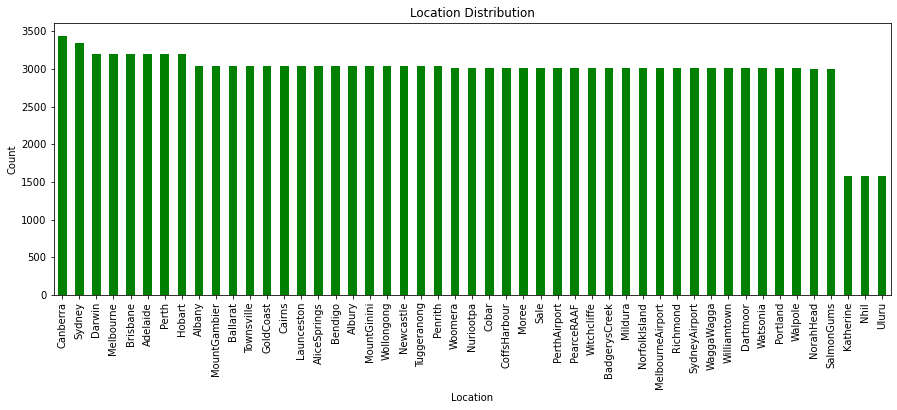

In [10]:
print("Distribution of Location")
#data['Location'].value_counts().plot(kind='bar',figsize=(18,5),fontsize = 15,color='green',title='Location Distribution',xlabel='Location',ylabel='Count')
data['Location'].value_counts().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='Location Distribution',xlabel='Location',ylabel='Count')

Distribution of WindGustDir


<AxesSubplot:title={'center':'WindGustDir Distribution'}, xlabel='WindGustDir', ylabel='Count'>

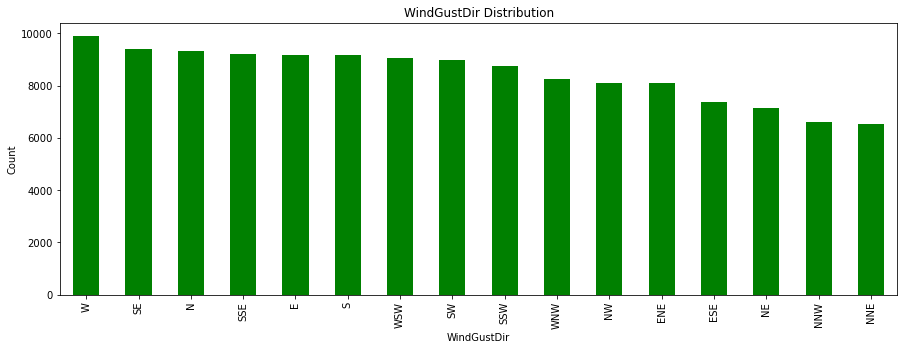

In [11]:
print("Distribution of WindGustDir")
data['WindGustDir'].value_counts().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='WindGustDir Distribution',xlabel='WindGustDir',ylabel='Count')

Distribution of WindDir9am


<AxesSubplot:title={'center':'WindDir9am Distribution'}, xlabel='WindDir9am', ylabel='Count'>

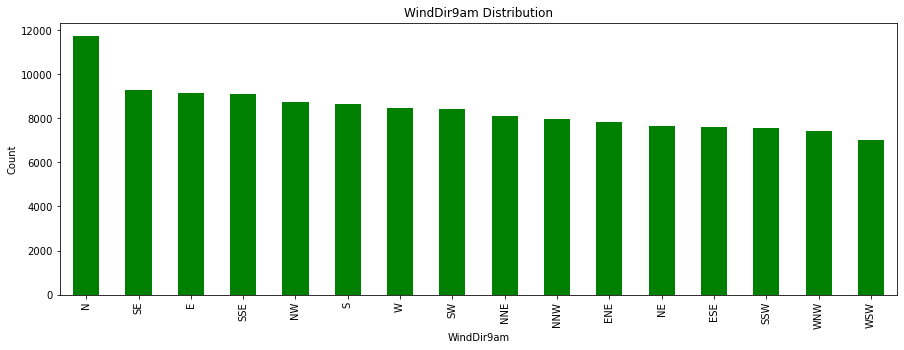

In [12]:
print("Distribution of WindDir9am")
data['WindDir9am'].value_counts().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='WindDir9am Distribution',xlabel='WindDir9am',ylabel='Count')

Distribution of WindDir3pm


<AxesSubplot:title={'center':'WindDir3pm Distribution'}, xlabel='WindDir3pm', ylabel='Count'>

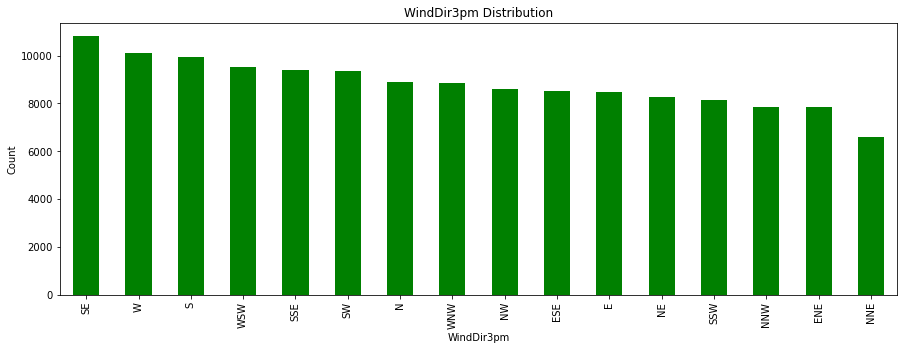

In [13]:
print("Distribution of WindDir3pm")
data['WindDir3pm'].value_counts().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='WindDir3pm Distribution',xlabel='WindDir3pm',ylabel='Count')

Distribution of RainToday


<AxesSubplot:title={'center':'RainToday Distribution'}, xlabel='RainToday', ylabel='Count'>

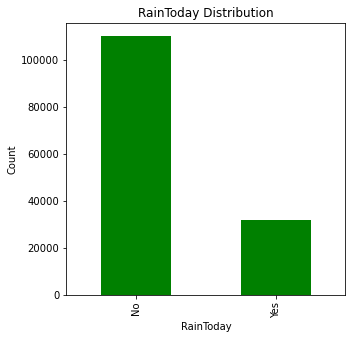

In [14]:
print("Distribution of RainToday")
data['RainToday'].value_counts().plot(kind='bar',figsize=(5,5),fontsize = 10,color='green',title='RainToday Distribution',xlabel='RainToday',ylabel='Count')

Distribution of RainTomorrow


<AxesSubplot:title={'center':'RainTomorrow Distribution'}, xlabel='RainTomorrow', ylabel='Count'>

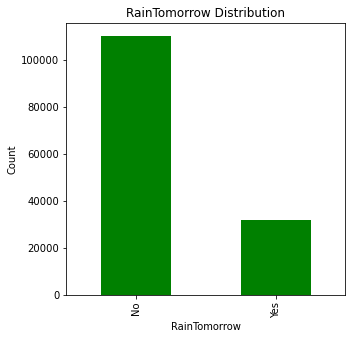

In [15]:
print("Distribution of RainTomorrow")
data['RainTomorrow'].value_counts().plot(kind='bar',figsize=(5,5),fontsize = 10,color='green',title='RainTomorrow Distribution',xlabel='RainTomorrow',ylabel='Count')

In [16]:
data['Date'] = pd.to_datetime(data['Date'])
data.insert(0, 'Year', data['Date'].dt.year)
data.insert(0, 'Month', data['Date'].dt.month)
data.insert(0, 'Day', data['Date'].dt.day)
data = data.drop(['Date'], axis= 1)
data.head()

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,Albury,13.4,22.9,0.6,NaN,NaN,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2,12,2008,Albury,7.4,25.1,0.0,NaN,NaN,WNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,3,12,2008,Albury,12.9,25.7,0.0,NaN,NaN,WSW,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,4,12,2008,Albury,9.2,28.0,0.0,NaN,NaN,NE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,5,12,2008,Albury,17.5,32.3,1.0,NaN,NaN,W,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


Distribution of Day


<AxesSubplot:title={'center':'Day Distribution'}, xlabel='Day', ylabel='Count'>

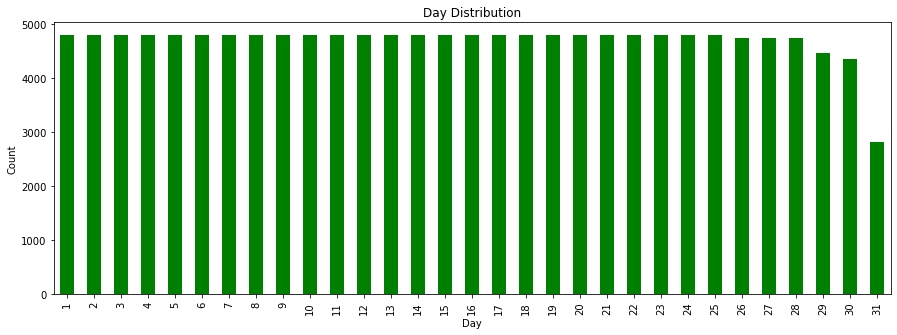

In [17]:
print("Distribution of Day")
data['Day'].value_counts().sort_index().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='Day Distribution',xlabel='Day',ylabel='Count')

Distribution of Month


<AxesSubplot:title={'center':'Month Distribution'}, xlabel='Month', ylabel='Count'>

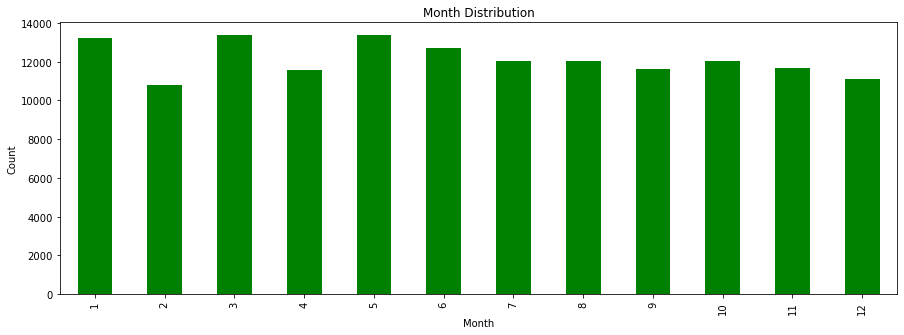

In [18]:
print("Distribution of Month")
data['Month'].value_counts().sort_index().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='Month Distribution',xlabel='Month',ylabel='Count')

Distribution of Year


<AxesSubplot:title={'center':'Year Distribution'}, xlabel='Month', ylabel='Count'>

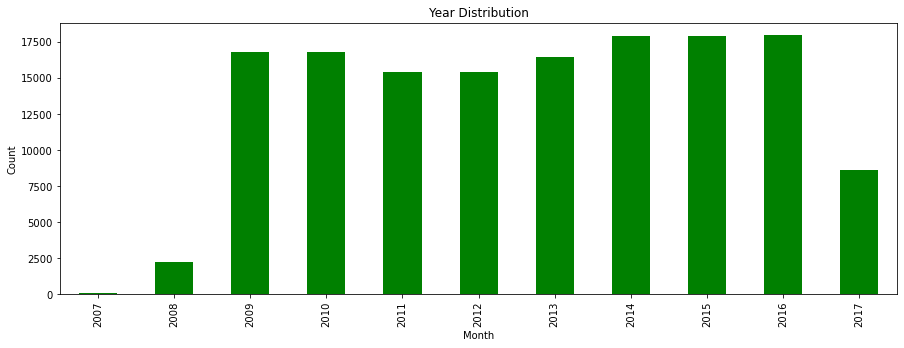

In [19]:
print("Distribution of Year")
data['Year'].value_counts().sort_index().plot(kind='bar',figsize=(15,5),fontsize = 10,color='green',title='Year Distribution',xlabel='Month',ylabel='Count')

<AxesSubplot:xlabel='Temp3pm', ylabel='Density'>

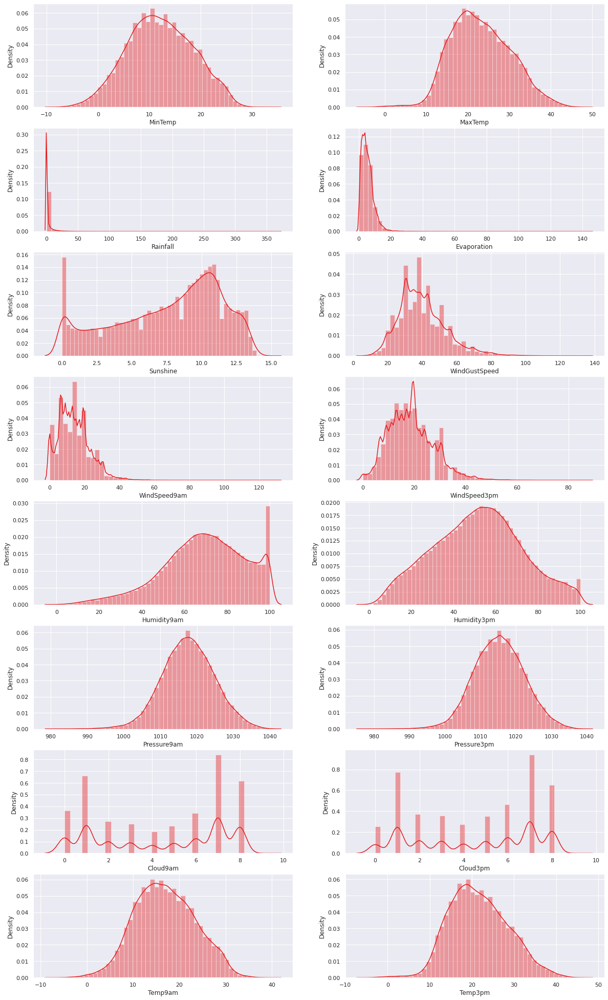

In [20]:
warnings.filterwarnings("ignore")
sns.set(style="darkgrid",palette='Set1')
fig,axes = plt.subplots(nrows=8,ncols=2,figsize=(20,35))
sns.distplot(data.MinTemp,ax=axes[0,0])
sns.distplot(data.MaxTemp,ax=axes[0,1])
sns.distplot(data.Rainfall,ax=axes[1,0])
sns.distplot(data.Evaporation,ax=axes[1,1])
sns.distplot(data.Sunshine,ax=axes[2,0])
sns.distplot(data.WindGustSpeed,ax=axes[2,1])
sns.distplot(data.WindSpeed9am,ax=axes[3,0])
sns.distplot(data.WindSpeed3pm,ax=axes[3,1])
sns.distplot(data.Humidity9am,ax=axes[4,0])
sns.distplot(data.Humidity3pm,ax=axes[4,1])
sns.distplot(data.Pressure9am,ax=axes[5,0])
sns.distplot(data.Pressure3pm,ax=axes[5,1])
sns.distplot(data.Cloud9am,ax=axes[6,0])
sns.distplot(data.Cloud3pm,ax=axes[6,1])
sns.distplot(data.Temp9am,ax=axes[7,0])
sns.distplot(data.Temp3pm,ax=axes[7,1])

Pairplot for all columns

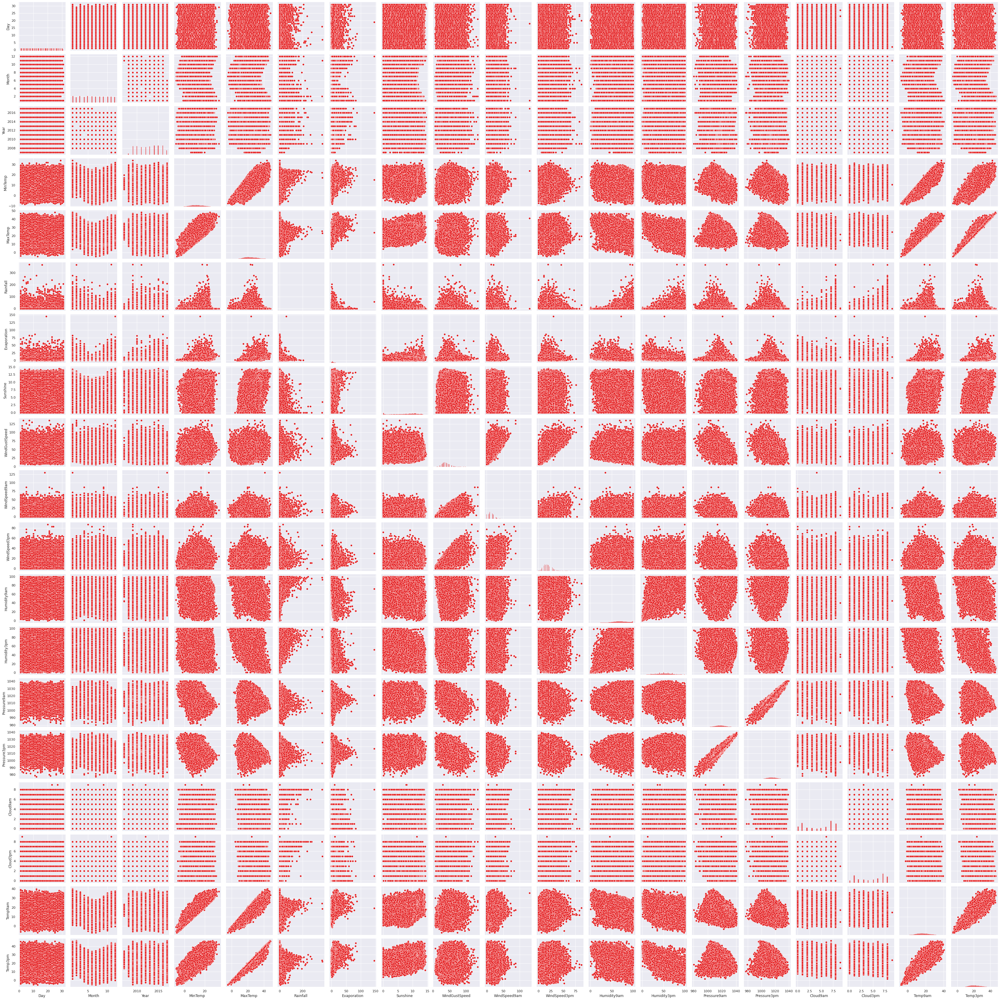

In [21]:
sns.pairplot(data, kind='scatter', diag_kind='hist', palette='Rainbow')
plt.show()

Railfall distribution in every month

Text(0.5, 1.0, 'Rainfall distribution in every month')

<Figure size 1080x720 with 0 Axes>

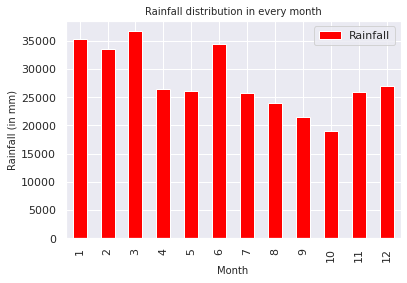

In [22]:
plt.figure(figsize=(15,10))
a = data.groupby('Month').agg({'Rainfall':'sum'})
a.plot(kind='bar', color='red')
plt.ylabel('Rainfall (in mm)', fontsize=10)
plt.xlabel('Month', fontsize=10)
plt.title('Rainfall distribution in every month', fontsize=10)

Railfall distribution with location

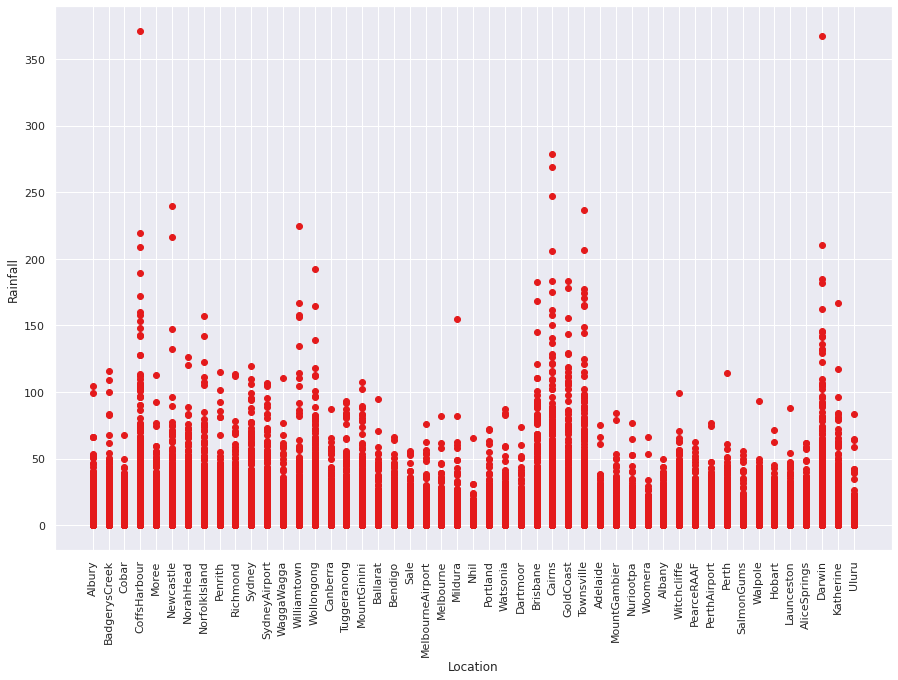

In [23]:
plt.figure(figsize=(15,10))
plt.ylabel("Rainfall")
plt.xlabel("Location")
plt.scatter(data['Location'],data['Rainfall'])
plt.xticks(rotation=90)
plt.show()

# Pre-Processing

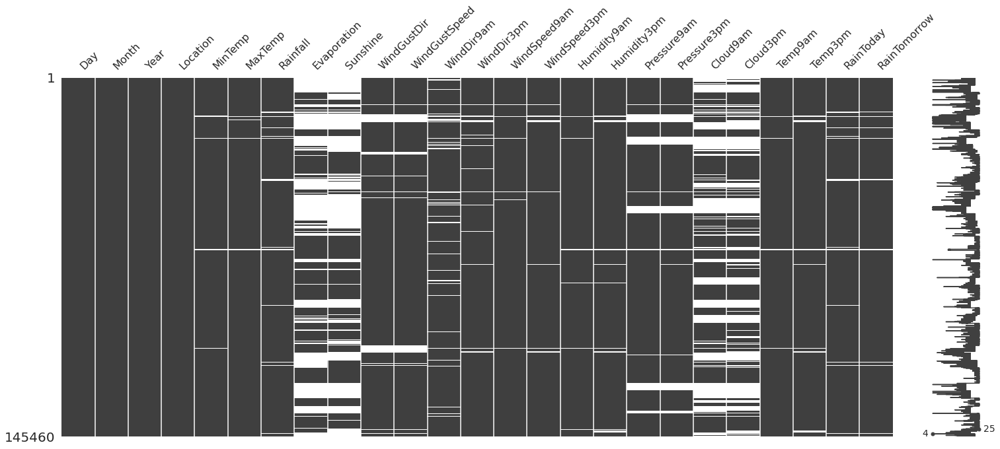

In [24]:
# visulation of missing data
misno.matrix(data);

<AxesSubplot:>

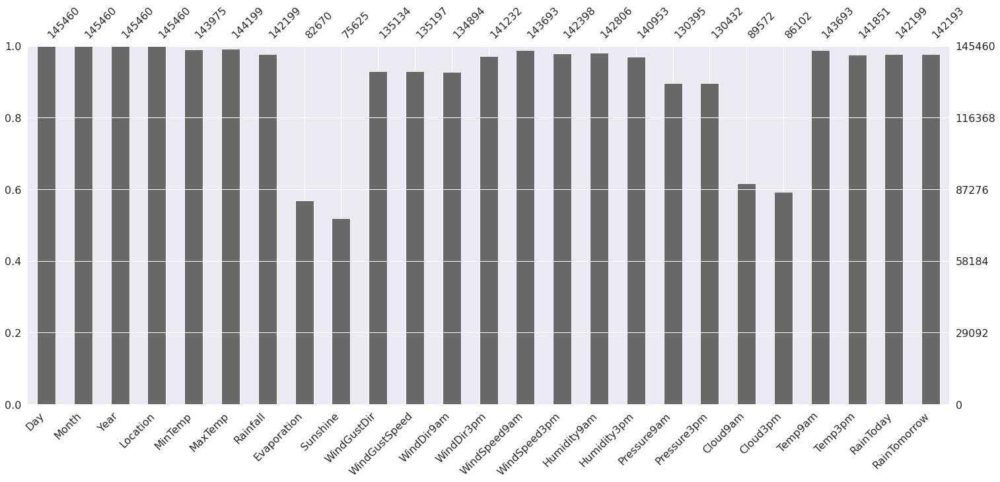

In [25]:
misno.bar(data)

In [26]:
# display categorical variables
categorical = [col for col in data.columns if data[col].dtypes == 'O']
categorical

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [27]:
# check missing values in categorical variables
data[categorical].isnull().sum()

Location            0
WindGustDir     10326
WindDir9am      10566
WindDir3pm       4228
RainToday        3261
RainTomorrow     3267
dtype: int64

<AxesSubplot:>

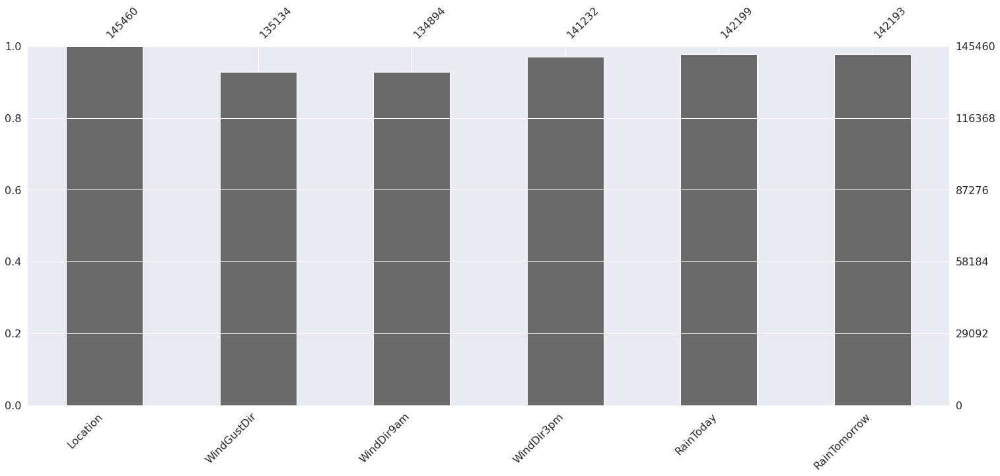

In [28]:
# Visual look of missing value in categorical variables
misno.bar(data[categorical])

In [29]:
# Replace missing value of categorical variable with mode
for df in [data]:
    df['WindGustDir'].fillna(data['WindGustDir'].mode()[0], inplace=True)
    df['WindDir9am'].fillna(data['WindDir9am'].mode()[0], inplace=True)
    df['WindDir3pm'].fillna(data['WindDir3pm'].mode()[0], inplace=True)
    df['RainToday'].fillna(data['RainToday'].mode()[0], inplace=True)
    df['RainTomorrow'].fillna(data['RainTomorrow'].mode()[0], inplace=True)

In [30]:
# Again check missing values in categorical variables
data[categorical].isnull().sum()

Location        0
WindGustDir     0
WindDir9am      0
WindDir3pm      0
RainToday       0
RainTomorrow    0
dtype: int64

<AxesSubplot:>

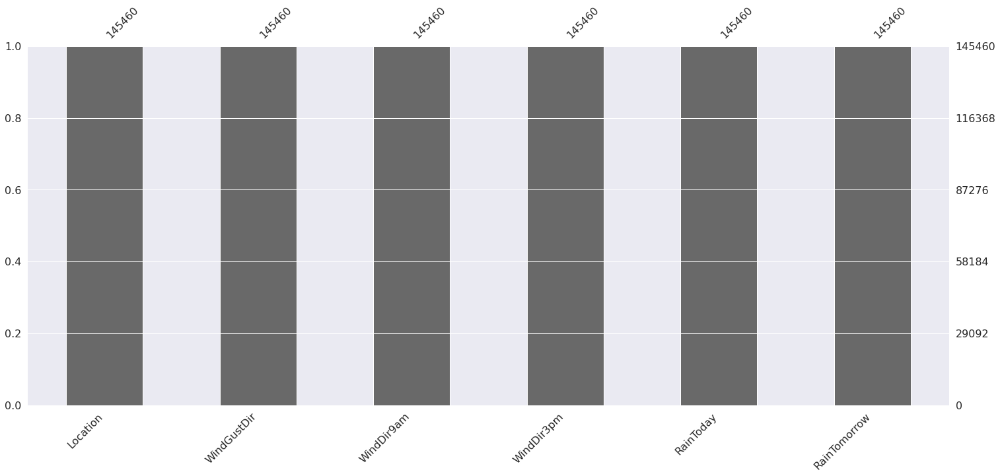

In [31]:
# Again visual look of missing value in categorical variables
misno.bar(data[categorical])

In [32]:
# display numerical|continuous variables
numerical = [col for col in data.columns if data[col].dtypes != 'O']
numerical

['Day',
 'Month',
 'Year',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [33]:
# check missing values in numerical|continuous variables
data[numerical].isnull().sum()

Day                  0
Month                0
Year                 0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustSpeed    10263
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
dtype: int64

<AxesSubplot:>

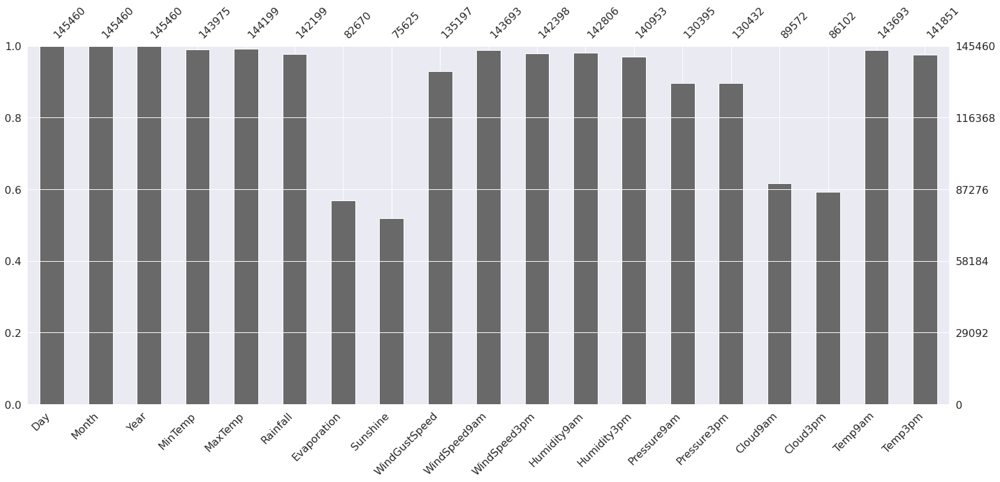

In [34]:
# Visual look of missing value in categorical variables
misno.bar(data[numerical])

In [35]:
# replace missing values in numerical column with respective column median 
for df in [data]:
    for col in numerical:
        col_median=data[col].median()
        df[col].fillna(col_median, inplace=True)           

In [36]:
# check again missing values in numerical variables
data[numerical].isnull().sum()

Day              0
Month            0
Year             0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

<AxesSubplot:>

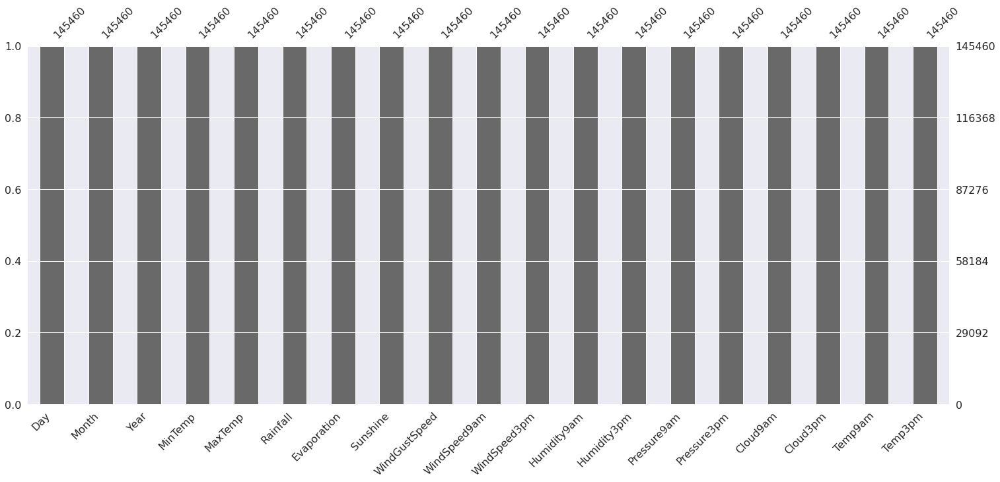

In [37]:
# Again visual look of missing value in categorical variables
misno.bar(data[numerical])

<AxesSubplot:>

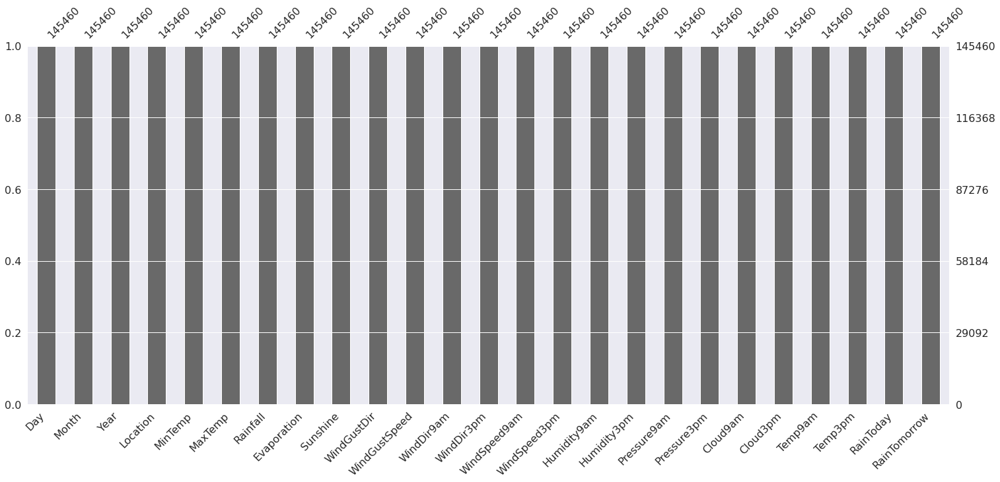

In [38]:
# Visual look of data
misno.bar(data)

In [39]:
# check Skewness
# Rainfall and Evaporation are higly positively skewed 
# Sunshine is higly negatively skewed
data.skew()

Day              0.009040
Month            0.030343
Year            -0.049357
MinTemp          0.022230
MaxTemp          0.224055
Rainfall         9.940909
Evaporation      5.177252
Sunshine        -1.070901
WindGustSpeed    0.923588
WindSpeed9am     0.786472
WindSpeed3pm     0.632461
Humidity9am     -0.491644
Humidity3pm      0.032054
Pressure9am     -0.098584
Pressure3pm     -0.045578
Cloud9am        -0.560375
Cloud3pm        -0.568990
Temp9am          0.090721
Temp3pm          0.247228
dtype: float64

In [40]:
# Fixing skewness
data['Rainfall'] = data['Rainfall'].replace([0], 0.01)
data['Rainfall']=np.reciprocal(data['Rainfall'])
data['Evaporation']=data['Evaporation'] ** (1/2)

data['Sunshine']=data['Sunshine']**2

In [41]:
# Again check Skewness
data.skew()

Day              0.009040
Month            0.030343
Year            -0.049357
MinTemp          0.022230
MaxTemp          0.224055
Rainfall        -0.624051
Evaporation      0.837799
Sunshine         0.388094
WindGustSpeed    0.923588
WindSpeed9am     0.786472
WindSpeed3pm     0.632461
Humidity9am     -0.491644
Humidity3pm      0.032054
Pressure9am     -0.098584
Pressure3pm     -0.045578
Cloud9am        -0.560375
Cloud3pm        -0.568990
Temp9am          0.090721
Temp3pm          0.247228
dtype: float64

In [42]:
# Replace No with 0 and Yes with 1 in columns RainToday and RainTomorrow
data['RainToday'] = data['RainToday'].map({'No': 0, 'Yes': 1})
data['RainTomorrow'] = data['RainTomorrow'].map({'No': 0, 'Yes': 1})
data.head(10)

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,Albury,13.4,22.9,1.666667,2.19089,70.56,W,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,2,12,2008,Albury,7.4,25.1,100.000000,2.19089,70.56,WNW,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,3,12,2008,Albury,12.9,25.7,100.000000,2.19089,70.56,WSW,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,4,12,2008,Albury,9.2,28.0,100.000000,2.19089,70.56,NE,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,5,12,2008,Albury,17.5,32.3,1.000000,2.19089,70.56,W,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
5,6,12,2008,Albury,14.6,29.7,5.000000,2.19089,70.56,WNW,...,55.0,23.0,1009.2,1005.4,5.0,5.0,20.6,28.9,0,0
6,7,12,2008,Albury,14.3,25.0,100.000000,2.19089,70.56,W,...,49.0,19.0,1009.6,1008.2,1.0,5.0,18.1,24.6,0,0
7,8,12,2008,Albury,7.7,26.7,100.000000,2.19089,70.56,W,...,48.0,19.0,1013.4,1010.1,5.0,5.0,16.3,25.5,0,0
8,9,12,2008,Albury,9.7,31.9,100.000000,2.19089,70.56,NNW,...,42.0,9.0,1008.9,1003.6,5.0,5.0,18.3,30.2,0,1
9,10,12,2008,Albury,13.1,30.1,0.714286,2.19089,70.56,W,...,58.0,27.0,1007.0,1005.7,5.0,5.0,20.1,28.2,1,0


In [43]:
# Encode the categorical columns 
from category_encoders import TargetEncoder
cols= ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']
te = TargetEncoder(cols)
data[cols] = te.fit_transform(data[cols],data.RainTomorrow)
data.head()

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,0.203289,13.4,22.9,1.666667,2.19089,70.56,0.250679,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,2,12,2008,0.203289,7.4,25.1,100.000000,2.19089,70.56,0.275691,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,3,12,2008,0.203289,12.9,25.7,100.000000,2.19089,70.56,0.229904,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,4,12,2008,0.203289,9.2,28.0,100.000000,2.19089,70.56,0.184915,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,5,12,2008,0.203289,17.5,32.3,1.000000,2.19089,70.56,0.250679,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


<AxesSubplot:>

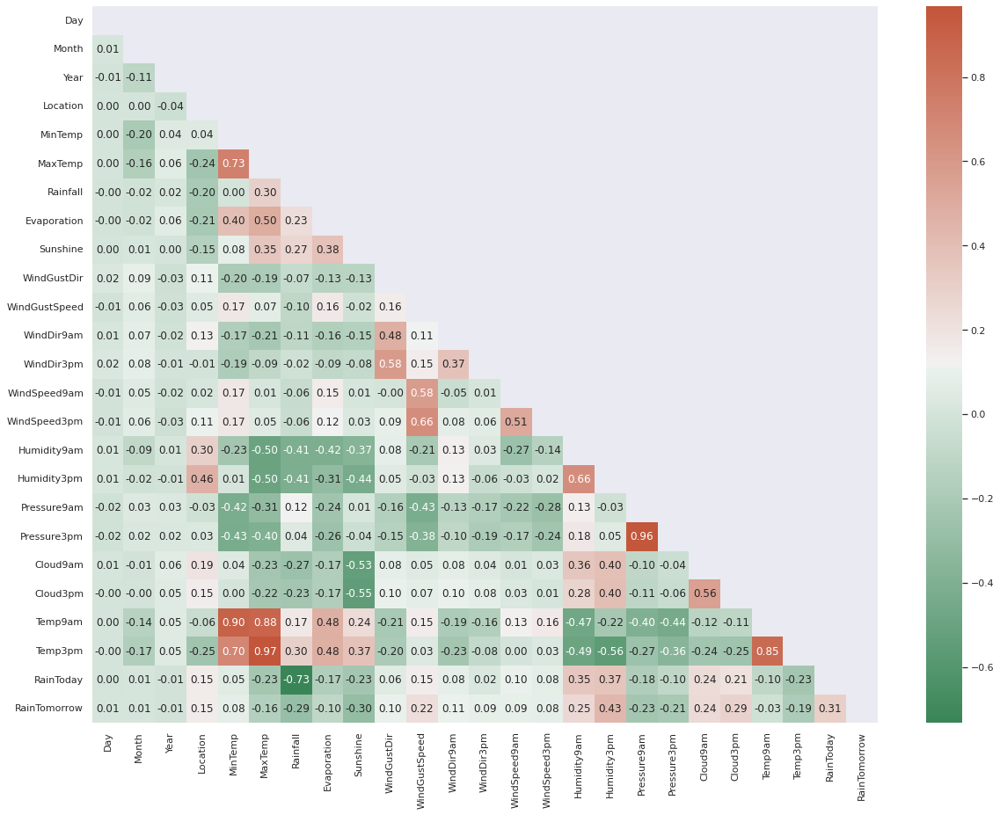

In [44]:
corr=data.corr()
f, ax = plt.subplots(figsize=(20, 15))
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(500, 20, as_cmap=True)
sns.heatmap(corr, annot=True, mask = mask, cmap=cmap, fmt='.2f')

In [45]:
# MaxTem is highly correlated with Temp3pm, Temp9am, MinTemp so drop this column
data = data.drop(['MaxTemp'], axis= 1)

In [46]:
# List of column
lst = data.columns.to_list()

In [47]:
# List of column
lst = data.columns.to_list()

In [48]:
# Data Normalization
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
cols = data.select_dtypes(np.float64).columns
data[cols] = scaler.fit_transform(data[cols])
data.head(10)



,Day,Month,Year,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,0.458788,0.516509,0.016640,0.181944,0.3356,0.771236,0.294574,...,0.71,0.22,0.449587,0.4800,0.888889,0.555556,0.508439,0.522073,0,0
1,2,12,2008,0.458788,0.375000,1.000000,0.181944,0.3356,0.957365,0.294574,...,0.44,0.25,0.497521,0.4912,0.555556,0.555556,0.514768,0.570058,0,0
2,3,12,2008,0.458788,0.504717,1.000000,0.181944,0.3356,0.616632,0.310078,...,0.38,0.30,0.447934,0.5056,0.555556,0.222222,0.594937,0.548944,0,0
3,4,12,2008,0.458788,0.417453,1.000000,0.181944,0.3356,0.281836,0.139535,...,0.45,0.16,0.613223,0.5712,0.555556,0.555556,0.533755,0.612284,0,0
4,5,12,2008,0.458788,0.613208,0.009973,0.181944,0.3356,0.771236,0.271318,...,0.82,0.33,0.500826,0.4624,0.777778,0.888889,0.527426,0.673704,0,0
5,6,12,2008,0.458788,0.544811,0.049974,0.181944,0.3356,0.957365,0.387597,...,0.55,0.23,0.474380,0.4528,0.555556,0.555556,0.586498,0.658349,0,0
6,7,12,2008,0.458788,0.537736,1.000000,0.181944,0.3356,0.771236,0.341085,...,0.49,0.19,0.480992,0.4976,0.111111,0.555556,0.533755,0.575816,0,0
7,8,12,2008,0.458788,0.382075,1.000000,0.181944,0.3356,0.771236,0.224806,...,0.48,0.19,0.543802,0.5280,0.555556,0.555556,0.495781,0.593090,0,0
8,9,12,2008,0.458788,0.429245,1.000000,0.181944,0.3356,1.000000,0.573643,...,0.42,0.09,0.469421,0.4240,0.555556,0.555556,0.537975,0.683301,0,1
9,10,12,2008,0.458788,0.509434,0.007116,0.181944,0.3356,0.771236,0.170543,...,0.58,0.27,0.438017,0.4576,0.555556,0.555556,0.575949,0.644914,1,0


# Classification

<AxesSubplot:xlabel='RainTomorrow', ylabel='Count'>

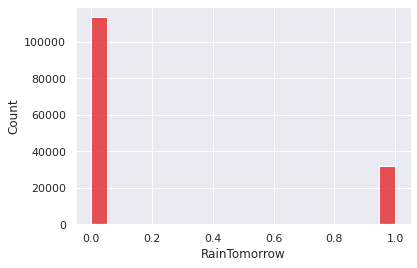

In [49]:
sns.histplot(data.RainTomorrow)

In [50]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data.drop('RainTomorrow',axis=1), 
                                                    data['RainTomorrow'], test_size=0.30, 
                                                    random_state=101)
X_valid, y_valid = X_test, y_test


In [51]:
y_test.unique()


array([0, 1])

In [52]:
Counter(y_train)

Counter({0: 79525, 1: 22297})

# Oversampling

In [53]:
smote = SMOTETomek(random_state=121)

In [54]:
X_train, y_train = smote.fit_resample(X_train, y_train)

In [55]:
print('Resampled dataset shape %s' % Counter(y_train))

Resampled dataset shape Counter({0: 78968, 1: 78968})


# Logistic Regression Classifier


In [56]:
m1 = 'Logistic Regression'
lr = LogisticRegression(solver='lbfgs', max_iter=3000)
model = lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)
lr_conf_matrix = confusion_matrix(y_test, lr_predict)
lr_acc_score = accuracy_score(y_test, lr_predict)
print("confussion matrix")
print(lr_conf_matrix)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score*100,'\n')
print(classification_report(y_test,lr_predict))

confussion matrix
[[26428  7630]
 [ 2282  7298]]


Accuracy of Logistic Regression: 7.728585178055823e+01 

              precision    recall  f1-score   support

           0       0.92      0.78      0.84     34058
           1       0.49      0.76      0.60      9580

    accuracy                           0.77     43638
   macro avg       0.70      0.77      0.72     43638
weighted avg       0.83      0.77      0.79     43638



In [57]:
score1=cross_val_score(lr,X_valid, y_valid,cv=10)
print(f"After k-fold cross validation score is {score1.mean()}")

After k-fold cross validation score is 0.8389707224718819


<AxesSubplot:>

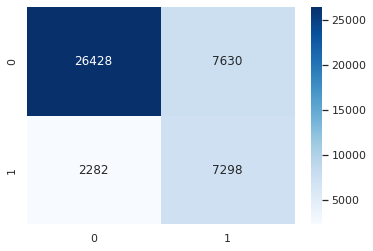

In [58]:
sns.heatmap(lr_conf_matrix, annot=True,fmt='g', cmap='Blues')

In [59]:
data = pd.DataFrame(classification_report(lr.predict(X_valid), 
                                        y_valid, digits=3,
                                        output_dict=True)).T
# print(data.columns)

data['support'] = data.support.apply(int)

data.style.background_gradient(cmap='viridis',
                             subset=pd.IndexSlice['0':'9', :'f1-score'])


,precision,recall,f1-score,support
0,0.775970,0.920515,0.842085,28710
1,0.761795,0.488880,0.595561,14928
accuracy,0.772859,0.772859,0.772859,0
macro avg,0.768883,0.704698,0.718823,43638
weighted avg,0.771121,0.772859,0.757752,43638


# Naive Bayes Classifier

In [60]:
m2 = 'Naive Bayes'
nb = GaussianNB()
nb.fit(X_train,y_train)
nbpred = nb.predict(X_test)
nb_conf_matrix = confusion_matrix(y_test, nbpred)
nb_acc_score = accuracy_score(y_test, nbpred)
print("confussion matrix")
print(nb_conf_matrix)
print("\n")
print("Accuracy of Naive Bayes model:",nb_acc_score*100,'\n')
print(classification_report(y_test,nbpred))

confussion matrix
[[24838  9220]
 [ 2181  7399]]


Accuracy of Naive Bayes model: 73.87368807003071 

              precision    recall  f1-score   support

           0       0.92      0.73      0.81     34058
           1       0.45      0.77      0.56      9580

    accuracy                           0.74     43638
   macro avg       0.68      0.75      0.69     43638
weighted avg       0.82      0.74      0.76     43638



In [61]:
score2=cross_val_score(nb,X_valid,y_valid,cv=10)
print(f"After k-fold cross validation score is {score2.mean()}")

After k-fold cross validation score is 0.7823454165128687


<AxesSubplot:>

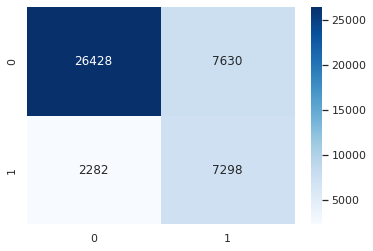

In [62]:
sns.heatmap(lr_conf_matrix, annot=True,fmt='g', cmap='Blues')

In [63]:
data = pd.DataFrame(classification_report(nb.predict(X_valid), 
                                        y_valid, digits=3,
                                        output_dict=True)).T
# print(data.columns)

data['support'] = data.support.apply(int)

data.style.background_gradient(cmap='viridis',
                             subset=pd.IndexSlice['0':'9', :'f1-score'])

,precision,recall,f1-score,support
0,0.729285,0.919279,0.813334,27019
1,0.772338,0.445213,0.564831,16619
accuracy,0.738737,0.738737,0.738737,0
macro avg,0.750812,0.682246,0.689082,43638
weighted avg,0.745681,0.738737,0.718695,43638


# Random Forest Classifier

In [64]:
m3 = 'Random Forest Classfier'
rf = RandomForestClassifier(n_estimators=50)
rf.fit(X_train,y_train)
rf_predicted = rf.predict(X_test)
rf_conf_matrix = confusion_matrix(y_test, rf_predicted)
rf_acc_score = accuracy_score(y_test, rf_predicted)
print("confussion matrix")
print(rf_conf_matrix)
print("\n")
print("Accuracy of Random Forest:",rf_acc_score*100,'\n')
print(classification_report(y_test,rf_predicted))

confussion matrix
[[30922  3136]
 [ 3607  5973]]


Accuracy of Random Forest: 84.54787112149961 

              precision    recall  f1-score   support

           0       0.90      0.91      0.90     34058
           1       0.66      0.62      0.64      9580

    accuracy                           0.85     43638
   macro avg       0.78      0.77      0.77     43638
weighted avg       0.84      0.85      0.84     43638



In [65]:
score3=cross_val_score(rf,X_valid,y_valid,cv=10)
print(f"After k-fold cross validation score is {score3.mean()}")

After k-fold cross validation score is 0.8504285789615326


<AxesSubplot:>

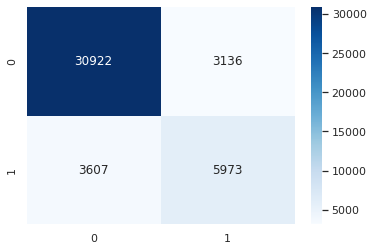

In [66]:
sns.heatmap(rf_conf_matrix, annot=True,fmt='g', cmap='Blues')

# Extreme Gradient Boost Classifier

In [67]:
m4 = 'Extreme Gradient Boost'
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
xgb_predicted = xgb.predict(X_test)
xgb_conf_matrix = confusion_matrix(y_test, xgb_predicted)
xgb_acc_score = accuracy_score(y_test, xgb_predicted)
print("confussion matrix")
print(xgb_conf_matrix)
print("\n")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score*100,'\n')
print(classification_report(y_test,xgb_predicted))

confussion matrix
[[32061  1997]
 [ 4217  5363]]


Accuracy of Extreme Gradient Boost: 85.76011732893349 

              precision    recall  f1-score   support

           0       0.88      0.94      0.91     34058
           1       0.73      0.56      0.63      9580

    accuracy                           0.86     43638
   macro avg       0.81      0.75      0.77     43638
weighted avg       0.85      0.86      0.85     43638



In [68]:
score4=cross_val_score(xgb,X_valid,y_valid,cv=10)
print(f"After k-fold cross validation score is {score4.mean()}")

After k-fold cross validation score is 0.8526742356618116


<AxesSubplot:>

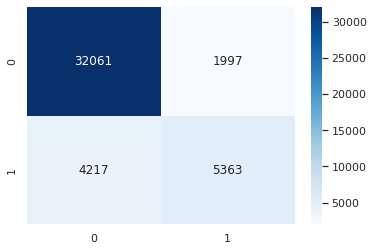

In [69]:
sns.heatmap(xgb_conf_matrix, annot=True,fmt='g', cmap='Blues')

# K-NeighborsClassifier Classifier

In [70]:
m5 = 'K-NeighborsClassifier'
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
knn_predicted = knn.predict(X_test)
knn_conf_matrix = confusion_matrix(y_test, knn_predicted)
knn_acc_score = accuracy_score(y_test, knn_predicted)
print("confussion matrix")
print(knn_conf_matrix)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score*100,'\n')
print(classification_report(y_test,knn_predicted))

confussion matrix
[[26276  7782]
 [ 2818  6762]]


Accuracy of K-NeighborsClassifier: 75.70924423667445 

              precision    recall  f1-score   support

           0       0.90      0.77      0.83     34058
           1       0.46      0.71      0.56      9580

    accuracy                           0.76     43638
   macro avg       0.68      0.74      0.70     43638
weighted avg       0.81      0.76      0.77     43638



In [71]:
score5=cross_val_score(knn,X_valid,y_valid,cv=10)
print(f"After k-fold cross validation score is {score5.mean()}")

After k-fold cross validation score is 0.796805284753278


Minimum error:- 0.19838214400293322 at K = 2
[0.21726476923782026, 0.19838214400293322, 0.24290755763325542, 0.21957926577753334, 0.2557174939273111, 0.23254961272285624, 0.2633942893808149, 0.24366377927494384, 0.27008570511939134]


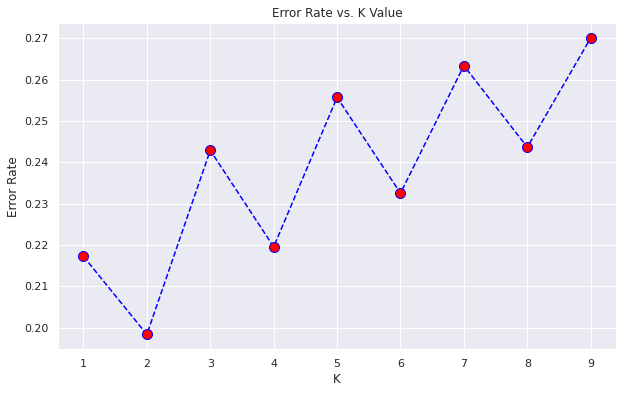

In [72]:
error_rate = []
for i in range(1,10):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,10),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",1+error_rate.index(min(error_rate)))

print(error_rate)

Maximum accuracy:- 0.8016178559970668 at K = 2


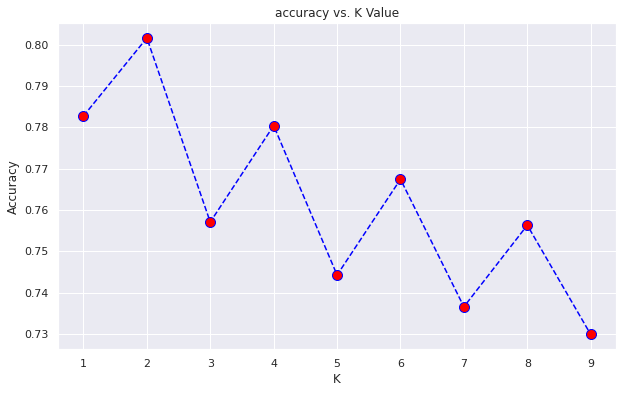

In [73]:
acc = []
# Will take some time
from sklearn import metrics
for i in range(1,10):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, yhat))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,10),acc,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",1+acc.index(max(acc)))

<AxesSubplot:>

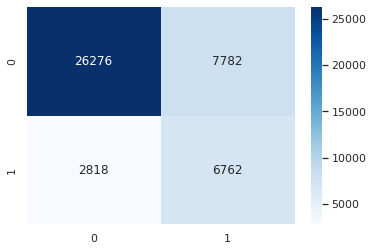

In [74]:
sns.heatmap(knn_conf_matrix, annot=True,fmt='g', cmap='Blues')

# Decision Tree Classifier

In [75]:
m6 = 'DecisionTreeClassifier'
dt = DecisionTreeClassifier(criterion = 'entropy')
dt.fit(X_train, y_train)
dt_predicted = dt.predict(X_test)
dt_conf_matrix = confusion_matrix(y_test, dt_predicted)
dt_acc_score = accuracy_score(y_test, dt_predicted)
print("confussion matrix")
print(dt_conf_matrix)
print("\n")
print("Accuracy of DecisionTreeClassifier:",dt_acc_score*100,'\n')
print(classification_report(y_test,dt_predicted))

confussion matrix
[[28456  5602]
 [ 4092  5488]]


Accuracy of DecisionTreeClassifier: 77.78541638021908 

              precision    recall  f1-score   support

           0       0.87      0.84      0.85     34058
           1       0.49      0.57      0.53      9580

    accuracy                           0.78     43638
   macro avg       0.68      0.70      0.69     43638
weighted avg       0.79      0.78      0.78     43638



In [76]:
score6=cross_val_score(dt,X_valid,y_valid,cv=10)
print(f"After k-fold cross validation score is {score6.mean()}")

After k-fold cross validation score is 0.7815664933415377


<AxesSubplot:>

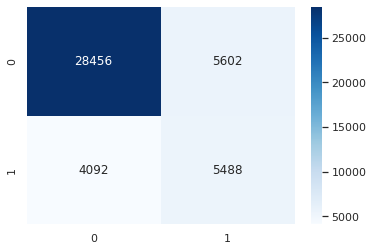

In [77]:
sns.heatmap(dt_conf_matrix, annot=True,fmt='g', cmap='Blues')

In [78]:
feat_importance = dt.tree_.compute_feature_importances(normalize=False)
print("feat importance = " + str(feat_importance))


feat importance = [0.02536885 0.01731319 0.01704842 0.03537371 0.02386926 0.02493668
 0.01749265 0.07209164 0.02144714 0.10558826 0.02368581 0.03009057
 0.02422048 0.02806434 0.0293703  0.24562962 0.02409684 0.05893536
 0.04579609 0.0792944  0.02346114 0.02622244 0.0006028 ]


# Support Vector Classifier

In [79]:
m7 = 'Support Vector Classifier'
svc =  SVC(kernel='linear', gamma='auto')
svc.fit(X_train, y_train)
svc_predicted = svc.predict(X_test)
svc_conf_matrix = confusion_matrix(y_test, svc_predicted)
svc_acc_score = accuracy_score(y_test, svc_predicted)
print("confussion matrix")
print(svc_conf_matrix)
print("\n")
print("Accuracy of Support Vector Classifier:",svc_acc_score*100,'\n')
print(classification_report(y_test,svc_predicted))

confussion matrix
[[25823  8235]
 [ 2025  7555]]


Accuracy of Support Vector Classifier: 76.48838168568679 

              precision    recall  f1-score   support

           0       0.93      0.76      0.83     34058
           1       0.48      0.79      0.60      9580

    accuracy                           0.76     43638
   macro avg       0.70      0.77      0.71     43638
weighted avg       0.83      0.76      0.78     43638



In [80]:
score7=cross_val_score(svc,X_valid,y_valid,cv=10)
print(f"After k-fold cross validation score is {score7.mean()}")

After k-fold cross validation score is 0.8402310446167075


<AxesSubplot:>

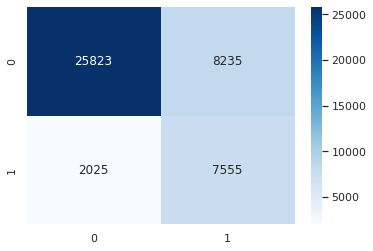

In [81]:
sns.heatmap(svc_conf_matrix, annot=True,fmt='g', cmap='Blues')

# Reciver Operating Characterstic (ROC) Curve

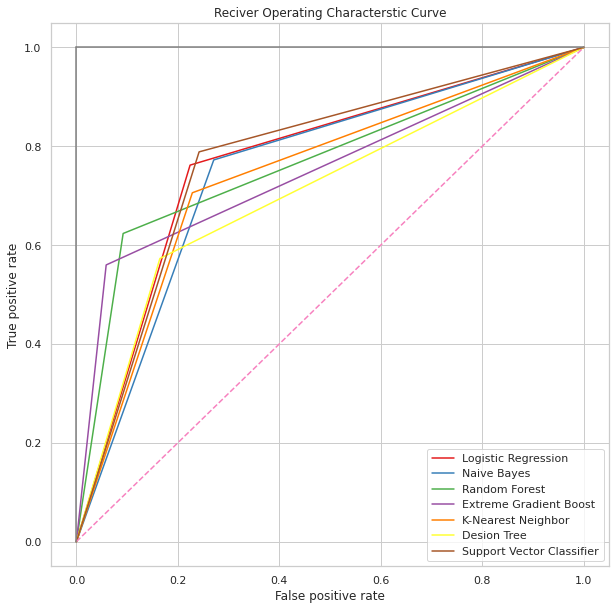

In [82]:
lr_false_positive_rate,lr_true_positive_rate,lr_threshold = roc_curve(y_test,lr_predict)
nb_false_positive_rate,nb_true_positive_rate,nb_threshold = roc_curve(y_test,nbpred)
rf_false_positive_rate,rf_true_positive_rate,rf_threshold = roc_curve(y_test,rf_predicted)                                                             
xgb_false_positive_rate,xgb_true_positive_rate,xgb_threshold = roc_curve(y_test,xgb_predicted)
knn_false_positive_rate,knn_true_positive_rate,knn_threshold = roc_curve(y_test,knn_predicted)
dt_false_positive_rate,dt_true_positive_rate,dt_threshold = roc_curve(y_test,dt_predicted)
svc_false_positive_rate,svc_true_positive_rate,svc_threshold = roc_curve(y_test,svc_predicted)


# auc score for each model
lr_auc_score = auc(lr_false_positive_rate,lr_true_positive_rate)
nb_auc_score = auc(nb_false_positive_rate,nb_true_positive_rate)
rf_auc_score = auc(rf_false_positive_rate,rf_true_positive_rate)
xgb_auc_score = auc(xgb_false_positive_rate,xgb_true_positive_rate)
knn_auc_score = auc(knn_false_positive_rate,knn_true_positive_rate)
dt_auc_score = auc(dt_false_positive_rate,dt_true_positive_rate)
svc_auc_score = auc(svc_false_positive_rate,svc_true_positive_rate)


sns.set_style('whitegrid')
plt.figure(figsize=(10,10))
plt.title('Reciver Operating Characterstic Curve')
plt.plot(lr_false_positive_rate,lr_true_positive_rate,label='Logistic Regression')
plt.plot(nb_false_positive_rate,nb_true_positive_rate,label='Naive Bayes')
plt.plot(rf_false_positive_rate,rf_true_positive_rate,label='Random Forest')
plt.plot(xgb_false_positive_rate,xgb_true_positive_rate,label='Extreme Gradient Boost')
plt.plot(knn_false_positive_rate,knn_true_positive_rate,label='K-Nearest Neighbor')
plt.plot(dt_false_positive_rate,dt_true_positive_rate,label='Desion Tree')
plt.plot(svc_false_positive_rate,svc_true_positive_rate,label='Support Vector Classifier')
plt.plot([0,1],ls='--')
plt.plot([0,0],[1,0],c='.5')
plt.plot([1,1],c='.5')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.legend()
plt.show()

# Important Feature of Extreme Gradient Boost Classifier

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

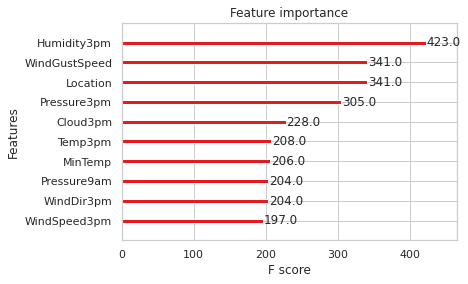

In [84]:
from xgboost import plot_importance
plot_importance(xgb, max_num_features=10)

# Important Feature of Logistic Regression Classifier

Feature- 0: Day, Score: -0.00261
Feature- 1: Month, Score: 0.01199
Feature- 2: Year, Score: -0.00140
Feature- 3: Location, Score: -0.16192
Feature- 4: MinTemp, Score: 0.95124
Feature- 5: Rainfall, Score: -0.18499
Feature- 6: Evaporation, Score: 0.01360
Feature- 7: Sunshine, Score: -2.39537
Feature- 8: WindGustDir, Score: 0.00755
Feature- 9: WindGustSpeed, Score: 3.00077
Feature-10: WindDir9am, Score: 0.21379
Feature-11: WindDir3pm, Score: 0.66104
Feature-12: WindSpeed9am, Score: 0.27267
Feature-13: WindSpeed3pm, Score: 0.21072
Feature-14: Humidity9am, Score: 0.97692
Feature-15: Humidity3pm, Score: 5.36942
Feature-16: Pressure9am, Score: -1.88894
Feature-17: Pressure3pm, Score: -2.48611
Feature-18: Cloud9am, Score: -0.39441
Feature-19: Cloud3pm, Score: 1.45652
Feature-20: Temp9am, Score: 0.59747
Feature-21: Temp3pm, Score: -0.59159
Feature-22: RainToday, Score: 0.14911


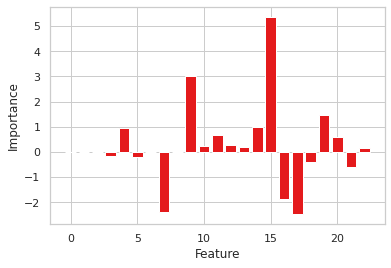

In [85]:
from matplotlib import pyplot
# get importance
importance = lr.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature-%2d: %s, Score: %.5f' % (i,lst[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.xlabel('Feature')
pyplot.ylabel('Importance')
pyplot.show()

# ACCURACY COMPARISON

In [86]:
scores = [score1.mean()*100,score2.mean()*100,score3.mean()*100,score4.mean()*100,score5.mean()*100,score6.mean()*100,score7.mean()*100]
scores

[83.89707224718819,
 78.23454165128688,
 85.04285789615325,
 85.26742356618115,
 79.6805284753278,
 78.15664933415377,
 84.02310446167075]

In [87]:
models = [m1, m2, m3, m4, m5, m6, m7]
models

['Logistic Regression',
 'Naive Bayes',
 'Random Forest Classfier',
 'Extreme Gradient Boost',
 'K-NeighborsClassifier',
 'DecisionTreeClassifier',
 'Support Vector Classifier']

In [88]:
model_dict = dict(zip(models, scores))
model_dict

{'Logistic Regression': 83.89707224718819,
 'Naive Bayes': 78.23454165128688,
 'Random Forest Classfier': 85.04285789615325,
 'Extreme Gradient Boost': 85.26742356618115,
 'K-NeighborsClassifier': 79.6805284753278,
 'DecisionTreeClassifier': 78.15664933415377,
 'Support Vector Classifier': 84.02310446167075}

In [89]:
sorted_models = dict(sorted(model_dict.items(), key=lambda item: item[1]))
sorted_models

{'DecisionTreeClassifier': 78.15664933415377,
 'Naive Bayes': 78.23454165128688,
 'K-NeighborsClassifier': 79.6805284753278,
 'Logistic Regression': 83.89707224718819,
 'Support Vector Classifier': 84.02310446167075,
 'Random Forest Classfier': 85.04285789615325,
 'Extreme Gradient Boost': 85.26742356618115}

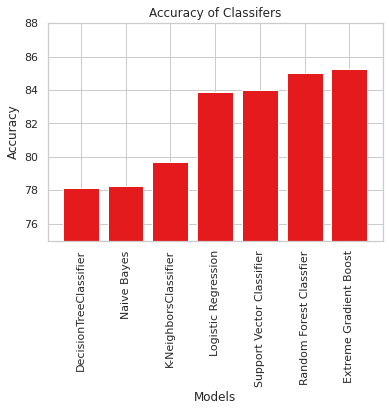

In [90]:

plt.bar(range(len(sorted_models)), sorted_models.values(), align='center')
plt.xticks(range(len(sorted_models)), sorted_models.keys(), rotation=90)
plt.ylim(75, 88)
plt.title("Accuracy of Classifers")
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.show()

In [91]:
import time
import numpy as np

start_time = time.time()
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.054 seconds


Feature- 0: Day, Score: 0.02293
Feature- 1: Month, Score: 0.01725
Feature- 2: Year, Score: 0.01621
Feature- 3: Location, Score: 0.03916
Feature- 4: MinTemp, Score: 0.02791
Feature- 5: Rainfall, Score: 0.03397
Feature- 6: Evaporation, Score: 0.02207
Feature- 7: Sunshine, Score: 0.07333
Feature- 8: WindGustDir, Score: 0.03061
Feature- 9: WindGustSpeed, Score: 0.05857
Feature-10: WindDir9am, Score: 0.02948
Feature-11: WindDir3pm, Score: 0.03292
Feature-12: WindSpeed9am, Score: 0.02574
Feature-13: WindSpeed3pm, Score: 0.02780
Feature-14: Humidity9am, Score: 0.04322
Feature-15: Humidity3pm, Score: 0.16519
Feature-16: Pressure9am, Score: 0.04094
Feature-17: Pressure3pm, Score: 0.04974
Feature-18: Cloud9am, Score: 0.06624
Feature-19: Cloud3pm, Score: 0.08837
Feature-20: Temp9am, Score: 0.02800
Feature-21: Temp3pm, Score: 0.03332
Feature-22: RainToday, Score: 0.02700


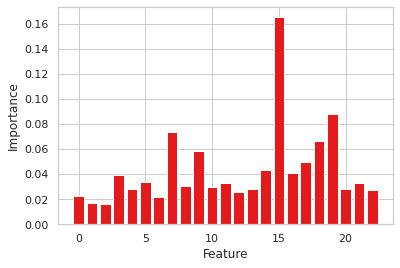

In [92]:
from matplotlib import pyplot
# get importance
importance = rf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature-%2d: %s, Score: %.5f' % (i,lst[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.xlabel('Feature')
pyplot.ylabel('Importance')
pyplot.show()

In [93]:
# print auc score for each model
print('Logistic Regression AUC Score: ',lr_auc_score)
print('Naive Bayes AUC Score: ',nb_auc_score)
print('Random Forest AUC Score: ',rf_auc_score)
print('Extreme Gradient Boost AUC Score: ',xgb_auc_score)
print('K-Nearest Neighbor AUC Score: ',knn_auc_score)
print('Desion Tree AUC Score: ',dt_auc_score)
print('Support Vector Classifier AUC Score: ',svc_auc_score)

Logistic Regression AUC Score:  0.7688829052637826
Naive Bayes AUC Score:  0.7508117706856694
Random Forest AUC Score:  0.7657041052773661
Extreme Gradient Boost AUC Score:  0.7505884196564597
K-Nearest Neighbor AUC Score:  0.7386764699932855
Desion Tree AUC Score:  0.7041880049641462
Support Vector Classifier AUC Score:  0.7734143590983378


In [94]:
# create the dictionary of models and auc score
auc_lst = {'Logistic Regression':lr_auc_score,'Naive Bayes':nb_auc_score,'Random Forest':rf_auc_score,'Extreme Gradient Boost':xgb_auc_score,'K-Nearest Neighbor':knn_auc_score,'Desion Tree':dt_auc_score,'Support Vector Classifier':svc_auc_score}
# sort the dictionary by auc score
auc_lst = dict(sorted(model_dict.items(), key=lambda item: item[1]))

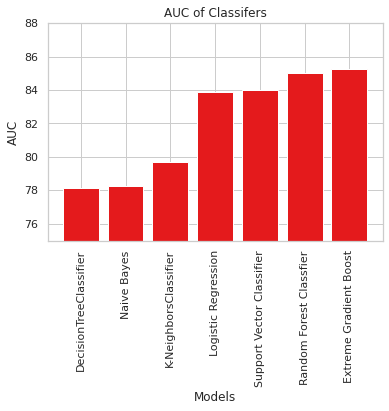

In [95]:
plt.bar(range(len(auc_lst)), auc_lst.values(), align='center')
plt.xticks(range(len(auc_lst)), auc_lst.keys(), rotation=90)
plt.ylim(75, 88)
plt.title("AUC of Classifers")
plt.xlabel('Models')
plt.ylabel('AUC')
plt.show()